In [1]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.integrate import odeint
from matplotlib import animation, rc
rc('animation', html='jshtml')

### Planetary motion

In [47]:
#[dxdt, dydt, dvdt_x, dvdt_y]
G = 1
m = 10

In [48]:
def sat_func(y_init_1, y_init_2):
  
    h = 0.1
    t = np.arange(0, 100 + h, h)
    y_1 = np.zeros((4, len(t)))
    y_2 = np.zeros((4, len(t)))
    
    y0_1 = y_init_1
    y0_2 = y_init_2

    #symplectic solver
    y_1[:, 0] = y0_1
    y_2[:, 0] = y0_2
    
    for i in range(0, len(t) -1):

        rcubed = ( (y_1[0,i] - y_2[0,i])**2 + (y_1[1,i] - y_2[1,i])**2 )**(3/2)
        

        
        
    #bodies indicies 1, 2
        
        v_next_x_1 = y_1[2,i] - G * m/rcubed * y_1[0,i] * h
        x_next_1 = y_1[0,i] + v_next_x_1 * h
        
        v_next_x_2 = y_2[2,i] - G * m/rcubed * y_2[0,i] * h
        x_next_2 = y_2[0,i] + v_next_x_2 * h
        
        

        v_next_y_1 = y_1[3,i] - G * m/rcubed * y_1[1,i] * h
        y_next_1 = y_1[1,i] + v_next_y_1 * h
        
        v_next_y_2 = y_2[3,i] - G * m/rcubed * y_2[1,i] * h
        y_next_2 = y_2[1,i] + v_next_y_2 * h

        

        y_1[:, i +1] = [x_next_1, y_next_1, v_next_x_1, v_next_y_1]
        y_2[:, i +1] = [x_next_2, y_next_2, v_next_x_2, v_next_y_2]
        
        
    ys_1 = y_1.transpose()
    ys_2 = y_2.transpose()

    
    position_xs_1 = ys_1[:, 0][0:]
    position_ys_1 = ys_1[:, 1][0:]
    
    position_xs_2 = ys_2[:, 0][0:]
    position_ys_2 = ys_2[:, 1][0:]
    
 
    
    #result = [position_xs_1, position_ys_1, position_xs_2, position_ys_2]
    
    return position_xs_1, position_ys_1, position_xs_2, position_ys_2 #result

In [49]:
y0_1 = [8, 0.1, 0.1, 0.1]
y0_2 = [-8, -0.1, -0.1, -0.1]  #changing last index from positive to negative changes from crash to working

position_xs_1, position_ys_1, position_xs_2, position_ys_2 = sat_func(y0_1, y0_2)


In [52]:
position_xs_1

array([8.        , 8.00980473, 8.01941469, ..., 4.19671762, 4.13749585,
       4.07763326])

### Plot

(-10.0, 10.0)

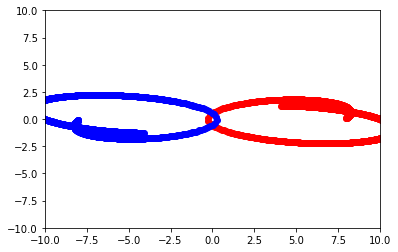

In [50]:
fig, ax = plt.subplots()

ax.plot(position_xs_1, position_ys_1, 'ro')
ax.plot(position_xs_2, position_ys_2, 'bo')


lim = 10
ax.set_xlim([-lim,lim])
ax.set_ylim([-lim, lim])


### Animation

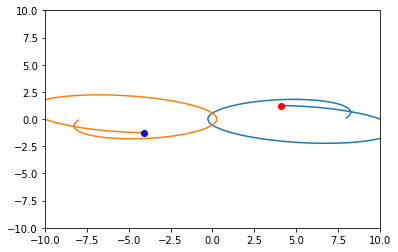

In [51]:
fig, ax = plt.subplots()

def update(i):
    
    line_1.set_data(position_xs_1[0:i+1], position_ys_1[0:i+1])
    planet_1.set_data(position_xs_1[i],position_ys_1[i])
    
    line_2.set_data(position_xs_2[0:i+1], position_ys_2[0:i+1])
    planet_2.set_data(position_xs_2[i],position_ys_2[i])
    
    return line_1, planet_1, line_2, planet_2



line_1, = ax.plot([], [])
planet_1, = ax.plot([], [], 'ro')

line_2, = ax.plot([], [])
planet_2, = ax.plot([], [], 'bo')


lim = 10
ax.set_xlim([-lim,lim])
ax.set_ylim([-lim, lim])


steps= len(position_xs_1)

anim = animation.FuncAnimation(fig,
                               update,
                               frames=steps,
                               interval=1,
                               blit=True,
                               repeat_delay=0)
anim



## Using scipy to integrate

In [29]:
G = 1
m = 10

def satelite_ODE(y1, y2, t):
    
    #assign ODE to vector element
    position_x1 = y1[0]
    position_y1 = y1[1]
    
    velocity_x1 = y1[2]
    velocity_y1 = y1[3]
    
    position_x2 = y2[0]
    position_y2 = y2[1]
    
    velocity_x2 = y2[2]
    velocity_y2 = y2[3]
    
    rcubed = ( (position_x1 - position_x2)**2 + (position_y1 - position_y2)**2 )**(3/2) 
    
    #Define ODEs
    dxdt_1 = velocity_x1
    dydt_1 = velocity_y1
    
    dxdt_2 = velocity_x2
    dydt_2 = velocity_y2
    
    
    dvdt_x1 = -G * m/rcubed * position_x1  
    dvdt_y1 = -G * m/rcubed * position_y1  
    
    dvdt_x2 = -G * m/rcubed * position_x2  
    dvdt_y2 = -G * m/rcubed * position_y2  
    
    return np.array([dxdt_1, dydt_1, dvdt_x1, dvdt_y1, dxdt_2, dydt_2, dvdt_x2, dvdt_y2])

In [30]:
y0_1 = np.array([8, 0.1, 0.1, 0.1])
y0_2 = np.array([-8, -0.1, -0.1, 0.1])
print(satelite_ODE(y1 = y0_1, y2 = y0_2, t = 0))

[ 0.1         0.1        -0.01952667 -0.00024408 -0.1         0.1
  0.01952667  0.00024408]


In [31]:
h = 0.01
t = np.arange(0,100 + h, h )
y = odeint(satelite_ODE, y0_1, y0_2, t)

position_scipy = y[:,0]

error: Extra arguments must be in a tuple.